# CIFAR-10 Classification with Unsupervised Machine Learning


## Project Description

This Unsupervised machine learning project is done for classification of Keras CIFAR-10 dataset as part of DTSA-5510 Unsupervised Algorithms in Machine Learning course for Master of Science in Data Science from University of Colorado, Boulder. 

## Problem Description

The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.

The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random order, but some training batches may contain more images from one class than another. Between them, the training batches contain exactly 5000 images from each class.

The classes are:

- Airplane
- Automobile
- Bird
- Cat
- Deer
- Dog
- Frog
- Horse
- Ship
- Truck

## Project Goal

In this notebook, I’ll approach this problem of classifying CIFAR-10 dataset using unsupervised machine learning algorithms by following these steps:
- Load and explore the data
- Data cleanup
- Exploratory Data Analysis (EDA)
- Preprocess the data
- Build, train, and evaluate models
- Compare results and discuss findings
  

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import NMF, PCA
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
import time
import warnings
from sklearn.model_selection import train_test_split

warnings.filterwarnings('ignore')

## Load Data

The CIFAR-10 dataset is a classic benchmark dataset in computer vision, consisting of 60,000 32x32 color images in 10 classes, comes with Keras pacakge itself.

To load the CIFAR-10 dataset in Keras, I have used the keras.datasets.cifar10.load_data() function which automatically splits the data in Train & Test batches of 50,000 & 10,000 images respectively. 

This tech report (Chapter 3) describes the dataset and the methodology followed when collecting it in much greater detail--

[Learning Multiple Layers of Features from Tiny Images](https://www.cs.toronto.edu/~kriz/learning-features-2009-TR.pdf>)

In [2]:
# Set random seed for reproducibility
np.random.seed(42)

# Load CIFAR10 dataset from keras
from keras.datasets import cifar10

# Load data
(X_train_full, y_train_full), (X_test, y_test) = cifar10.load_data()

# Convert labels from 2D to 1D arrays
y_train_full = y_train_full.reshape(-1)
y_test = y_test.reshape(-1)

# Define class names for better visualization
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
               'dog', 'frog', 'horse', 'ship', 'truck']

print("Basic Data statistics:")
print(f"Training data shape: {X_train_full.shape}")
print(f"Training labels shape: {y_train_full.shape}")
print(f"Test data shape: {X_test.shape}")
print(f"Test labels shape: {y_test.shape}")

# Image statistics
print("\nImage statistics:")
print("Pixel value range:", X_train_full.min(), "to", X_train_full.max())
print("Image shape:", X_train_full[0].shape)
print("Data type:", X_train_full.dtype)


Basic Data statistics:
Training data shape: (50000, 32, 32, 3)
Training labels shape: (50000,)
Test data shape: (10000, 32, 32, 3)
Test labels shape: (10000,)

Image statistics:
Pixel value range: 0 to 255
Image shape: (32, 32, 3)
Data type: uint8


## Data Cleanup

There was no data cleanup done for Keras CIFAR-10 dataset as--

__Pre-curated Dataset__: CIFAR-10 is a well-established, carefully curated benchmark dataset that has already undergone quality control. Unlike real-world datasets, it doesn't contain:

- Missing values
- Corrupted images
- Mislabeled samples 
- Inconsistent formatting


__Uniform Image Properties__: All images in CIFAR-10 have:

- Identical dimensions (32×32 pixels)
- Consistent color channels (RGB)
- Similar resolution and quality

__Built-in Train/Test Split__: The dataset comes with predefined training and testing sets, eliminating the need for manual splitting and stratification.

__Balanced Classes__: CIFAR-10 has exactly 6,000 images per class (balanced distribution), so no class imbalance handling was required.

__Nature of Image Data__: Unlike tabular data, images typically don't have issues like:

- Outliers that need removal 
- Categorical variables requiring encoding
- Date/time fields needing conversion

### Visualizing Samples

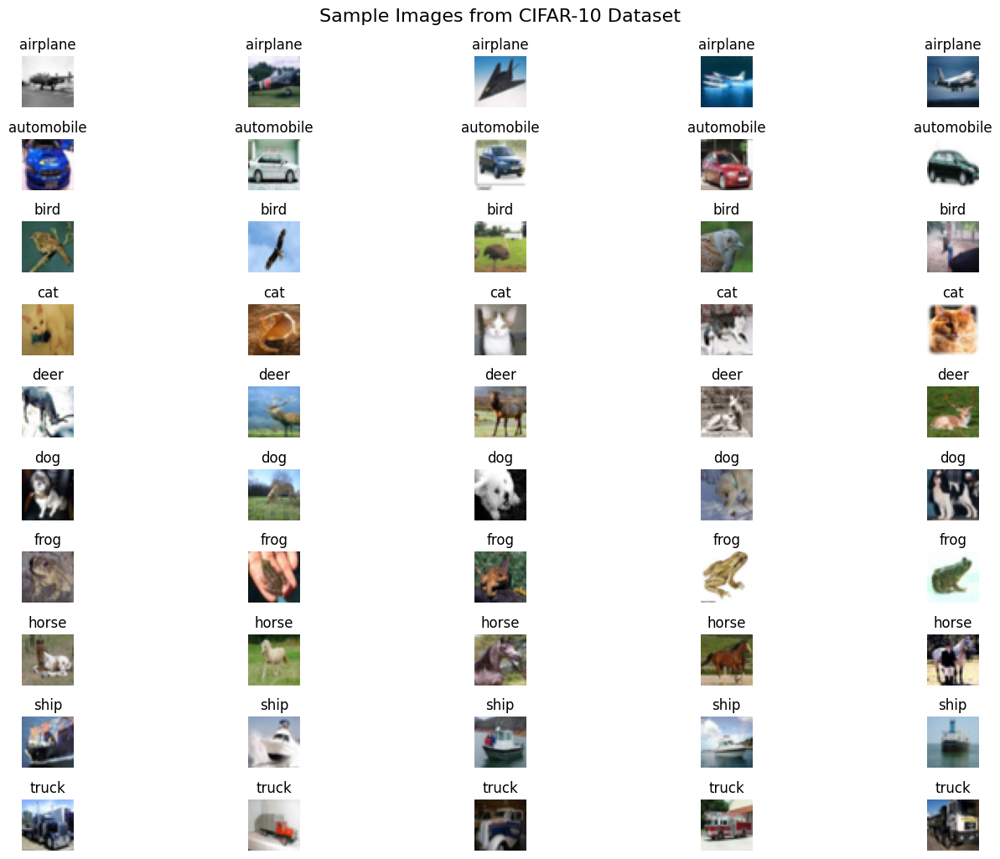

In [3]:
plt.figure(figsize=(15, 10))
for i in range(10):
    # Find indices for each class
    idx = np.where(y_train_full == i)[0]
    # Get 5 random images from each class
    sample_indices = np.random.choice(idx, 5, replace=False)
    
    for j, sample_idx in enumerate(sample_indices):
        plt.subplot(10, 5, i*5 + j + 1)
        plt.imshow(X_train_full[sample_idx])
        plt.title(f"{class_names[i]}")
        plt.axis('off')
        
plt.tight_layout()
plt.suptitle("Sample Images from CIFAR-10 Dataset", y=1.02, fontsize=16)
plt.show()

## Exploratory Data Analysis (EDA)

### Distribution of Classes

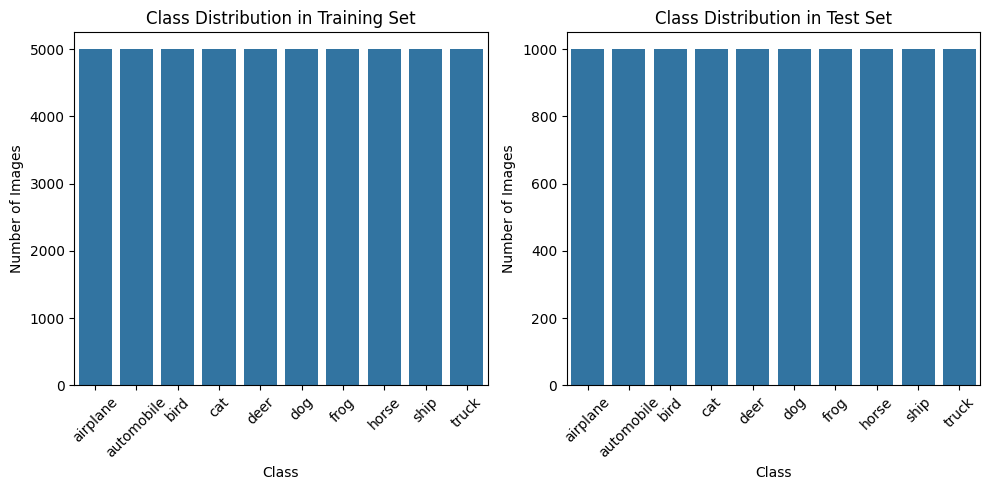

In [8]:
# Check class distribution
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.countplot(x=y_train_full)
plt.title("Class Distribution in Training Set")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(range(10), class_names, rotation=45)

plt.subplot(1, 2, 2)
sns.countplot(x=y_test)
plt.title("Class Distribution in Test Set")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(range(10), class_names, rotation=45)

plt.tight_layout()
plt.show()

__Observations__:
- Both the Train and Test set in totally balanced having same number of images for each 10 classes. 

### Pixel Value Distribution

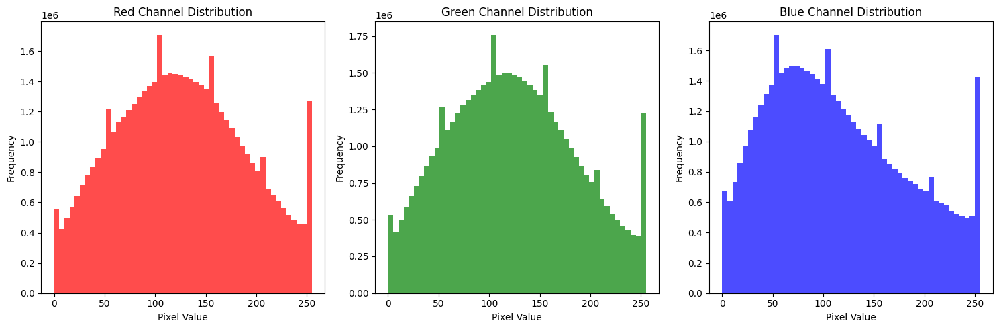

In [5]:
# Let's look at pixel intensity distribution
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(X_train_full[:, :, :, 0].flatten(), bins=50, color='red', alpha=0.7)
plt.title('Red Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(X_train_full[:, :, :, 1].flatten(), bins=50, color='green', alpha=0.7)
plt.title('Green Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(X_train_full[:, :, :, 2].flatten(), bins=50, color='blue', alpha=0.7)
plt.title('Blue Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

__Observations__:
- Pixel value ranes from 0 to 255.
- All the 3 type of color (RGB) pixels are having similar distribution. 

### Mean Images of Classes

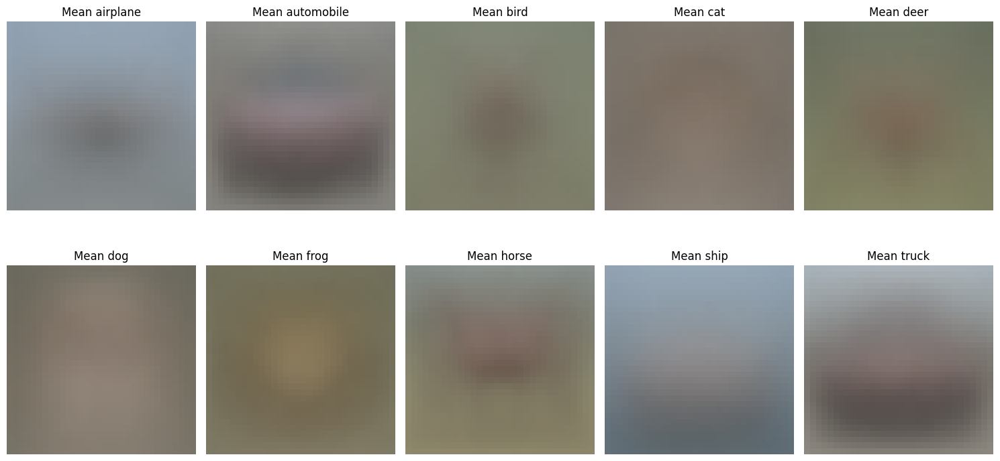

In [6]:
# Calculate mean and standard deviation for each class
class_means = []
class_stds = []

for i in range(10):
    class_images = X_train_full[y_train_full == i]
    class_mean = np.mean(class_images, axis=0)
    class_std = np.std(class_images, axis=0)
    
    class_means.append(class_mean)
    class_stds.append(class_std)

# Display mean images for each class
plt.figure(figsize=(15, 8))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(class_means[i].astype(int))
    plt.title(f"Mean {class_names[i]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

__Observations__:
- Mean airplane/ship images show a distinctive cruciform shape on a blue background
- Mean automobile/truck images reveal horizontal shapes with visible wheel positions
- Mean animal images (cats, dogs, deer) show basic body outlines with common postures
- The frog mean image typically shows a top-down view with a distinctive silhouette

### Pixel Correlation Analysis 

Correlation between Red and Green channels (first image): 0.9562
Correlation between Red and Blue channels (first image): 0.8439
Correlation between Green and Blue channels (first image): 0.8957


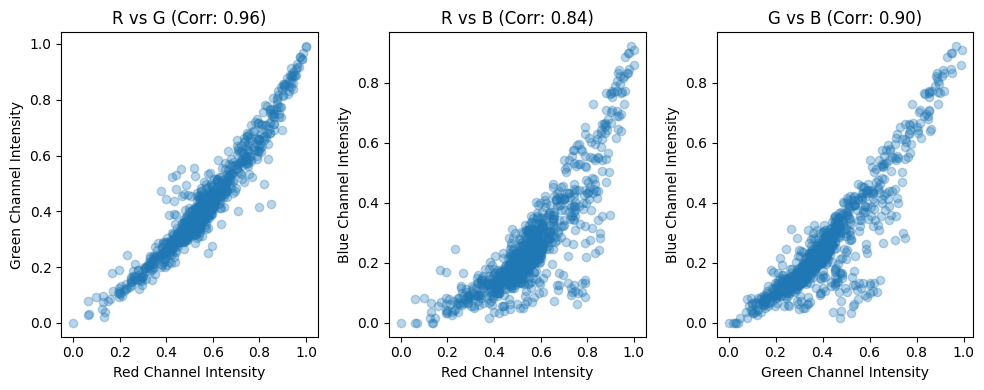

In [3]:
first_image = X_train_full[0] / 255.0  # Normalize to 0-1
red_channel = first_image[:, :, 0].flatten()
green_channel = first_image[:, :, 1].flatten()
blue_channel = first_image[:, :, 2].flatten()

correlation_rg = np.corrcoef(red_channel, green_channel)[0, 1]
correlation_rb = np.corrcoef(red_channel, blue_channel)[0, 1]
correlation_gb = np.corrcoef(green_channel, blue_channel)[0, 1]

print(f"Correlation between Red and Green channels (first image): {correlation_rg:.4f}")
print(f"Correlation between Red and Blue channels (first image): {correlation_rb:.4f}")
print(f"Correlation between Green and Blue channels (first image): {correlation_gb:.4f}")

# Visualize channel correlations for the first image
plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.scatter(red_channel, green_channel, alpha=0.3)
plt.title(f'R vs G (Corr: {correlation_rg:.2f})')
plt.xlabel('Red Channel Intensity')
plt.ylabel('Green Channel Intensity')

plt.subplot(1, 3, 2)
plt.scatter(red_channel, blue_channel, alpha=0.3)
plt.title(f'R vs B (Corr: {correlation_rb:.2f})')
plt.xlabel('Red Channel Intensity')
plt.ylabel('Blue Channel Intensity')

plt.subplot(1, 3, 3)
plt.scatter(green_channel, blue_channel, alpha=0.3)
plt.title(f'G vs B (Corr: {correlation_gb:.2f})')
plt.xlabel('Green Channel Intensity')
plt.ylabel('Blue Channel Intensity')

plt.tight_layout()
plt.show()

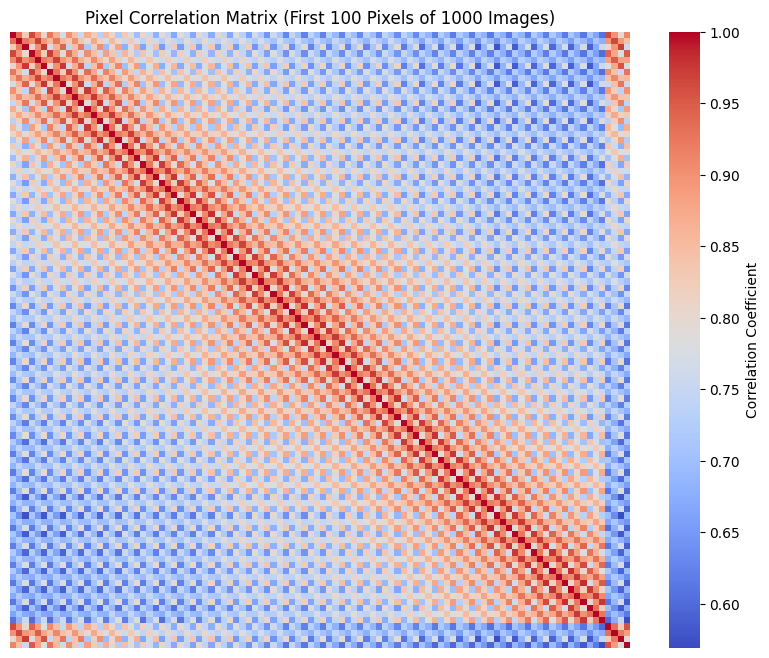

In [4]:
num_samples_corr = 1000  # Analyze a subset for efficiency
subset_images = X_train_full[:num_samples_corr].reshape(num_samples_corr, -1) / 255.0

correlation_matrix = np.corrcoef(subset_images, rowvar=False)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[:100, :100], cmap='coolwarm',
            xticklabels=[], yticklabels=[], cbar_kws={'label': 'Correlation Coefficient'})
plt.title(f'Pixel Correlation Matrix (First 100 Pixels of {num_samples_corr} Images)')
plt.show()

## Data Preprocessing

Data Preprocessing is primarily focused into--
- Transforming the data (flattening)
- Standardizing/Scaling pixel values
- Reducing dimensionality through PCA

### Flattening & Scaling Data

In [7]:
# Reshape the images to vectors
X_train_flattened = X_train_full.reshape(X_train_full.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

# Scale the data
X_train_scaled = X_train_flattened / 255.0
X_test_scaled = X_test_flattened / 255.0

print(f"Flattened & scaled training data shape: {X_train_scaled.shape}")
print(f"Flattened & scaled test data shape: {X_test_scaled.shape}")

Flattened & scaled training data shape: (50000, 3072)
Flattened & scaled test data shape: (10000, 3072)


### Dimensionality Reduction with PCA

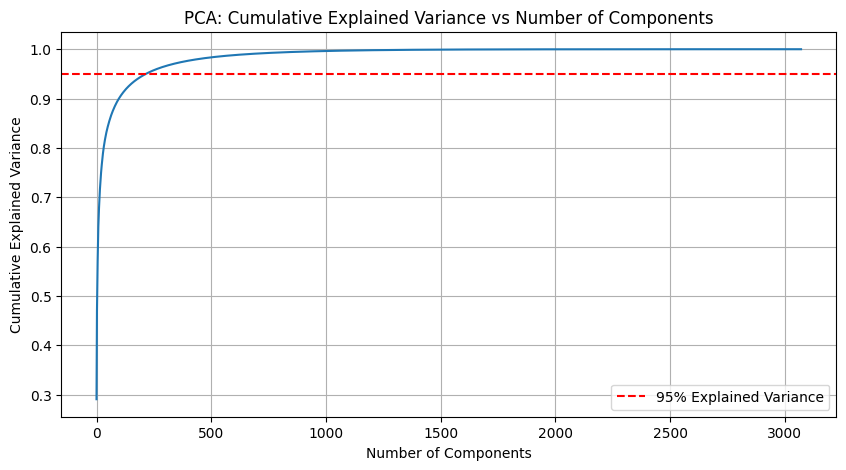

In [9]:
pca = PCA().fit(X_train_scaled)
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(10, 5))
plt.plot(cumulative_variance)
plt.grid(True)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Explained Variance vs Number of Components')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Explained Variance')
plt.legend()
plt.show()

In [12]:
# Getting the number of components that explain 95% of variance
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Number of components explaining 95% variance: {n_components}")

# Apply PCA with the determined number of components
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)

print(f"\nPCA-transformed training data shape: {X_train_pca.shape}")
print(f"PCA-transformed test data shape: {X_test_pca.shape}")

Number of components explaining 95% variance: 217

PCA-transformed training data shape: (50000, 217)
PCA-transformed test data shape: (10000, 217)


__Observations__:
- After flattening and scaling the data the number of features are 3072, which is high.
- With PCA, it has been reduced to 217 featues that explains 95% of variance.

## Model Building and Training

For this CIFAR-10 classification I have used below algorithms--
- K-Means Clustering
- Hierarchical/Agglomerative Clustering
- Non-Negative Matrix Factorization (NMF)

__Silhouette Score__ have been used for evaluation of these cluserting algorithms as it measures how similar objects are to their assigned cluster compared to other clusters.

Ref: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

__t-distributed stochastic neighbor embedding__ dimensionality reduction technique have been used to visualize cluster separation.

Ref: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

### K-Means Clustering

- K-Means efficiently partitions the high-dimensional image data into k distinct clusters.
- This algorithm works well for discovering natural groupings in the image space based on pixel similarities.
- For CIFAR-10's diverse object categories, K-Means can identify visual patterns that often correspond to semantic categories (like animals or vehicles) without requiring labels.
- Its computational efficiency makes it practical for the 50,000 images in CIFAR-10 train set, and the resulting cluster centroids can serve as representative prototypes for each discovered image group.

#### Model Building

##### Elbow Method for Optimal Number of Clusters

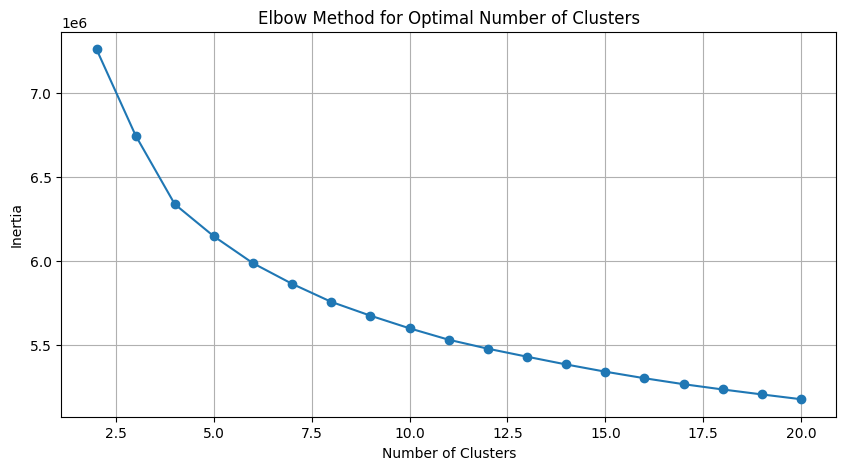

In [13]:
# Determining the optimal number of clusters with the Elbow method
inertia = []
range_n_clusters = range(2, 21)

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(X_train_pca)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.grid(True)
plt.show()

##### Silhouette scores for different cluster numbers

For n_clusters = 4, the silhouette score is 0.102
For n_clusters = 5, the silhouette score is 0.081
For n_clusters = 6, the silhouette score is 0.076
For n_clusters = 7, the silhouette score is 0.074
For n_clusters = 8, the silhouette score is 0.065
For n_clusters = 9, the silhouette score is 0.063
For n_clusters = 10, the silhouette score is 0.055
For n_clusters = 11, the silhouette score is 0.055
For n_clusters = 12, the silhouette score is 0.053
For n_clusters = 13, the silhouette score is 0.048
For n_clusters = 14, the silhouette score is 0.045


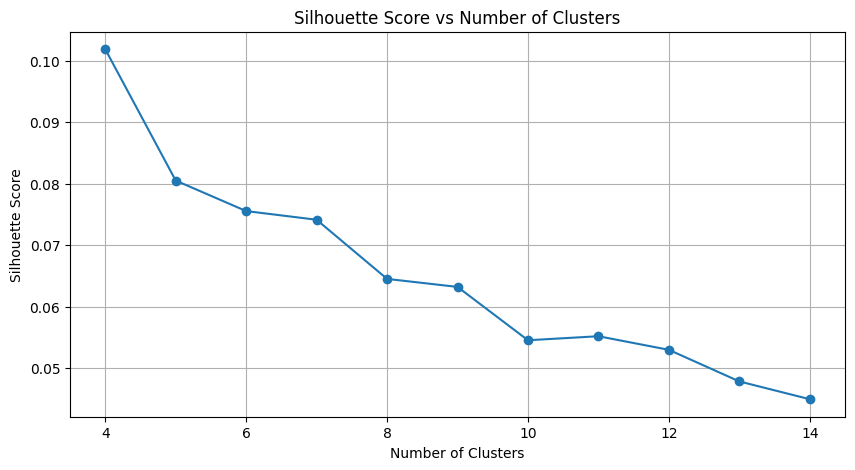

In [14]:
# Calculating silhouette scores for different cluster numbers
silhouette_scores = []
for n_clusters in range(4, 15):  # Starting at 4 to avoid very small numbers of clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_train_pca)
    silhouette_avg = silhouette_score(X_train_pca, cluster_labels, random_state=42)
    silhouette_scores.append(silhouette_avg)
    print(f"For n_clusters = {n_clusters}, the silhouette score is {silhouette_avg:.3f}")

plt.figure(figsize=(10, 5))
plt.plot(range(4, 15), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid(True)
plt.show()

#### Model Build with 10 clusters

In [15]:
optimal_k = 10 # Train set have 10 classes
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_train_pca)
kmeans_silhouette = silhouette_score(X_train_pca, kmeans_labels,random_state=42)
print(f"K-Means Clustering silhouette score: {kmeans_silhouette:.4f}")

K-Means Clustering silhouette score: 0.0545


####  Visualize Clusters on PCA-reduced data

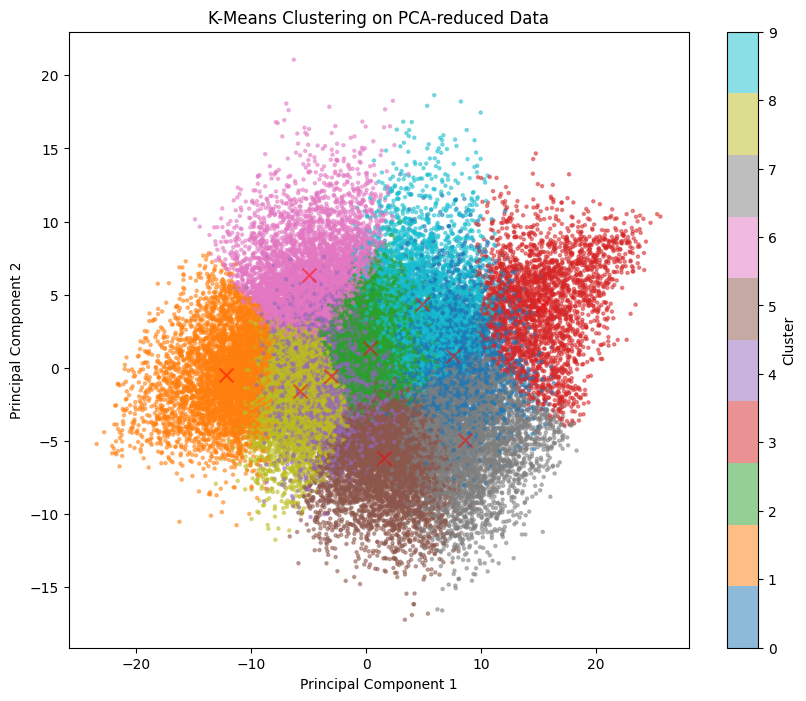

In [16]:
# Visualize the first few principal components
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_train_scaled)

# Visualize clusters on PCA-reduced data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=kmeans_labels, 
                     cmap='tab10', alpha=0.5, s=5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', s=100, alpha=0.5, marker='x')
plt.colorbar(scatter, label='Cluster')
plt.title('K-Means Clustering on PCA-reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

####  t-SNE Projection of Clusters

Computing t-SNE projection...


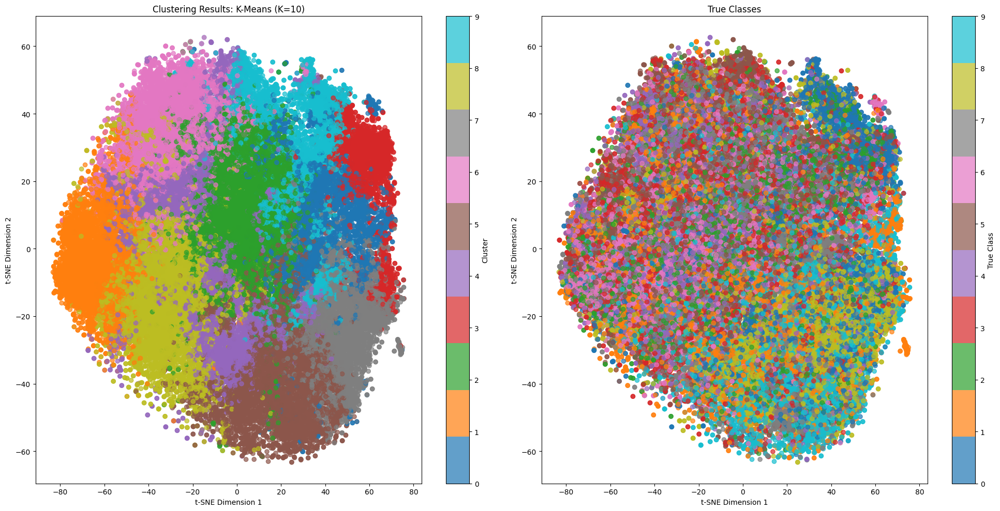

In [17]:
# Use t-SNE for visualization (reduce to 2D)
print("Computing t-SNE projection...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_train_pca)

plt.figure(figsize=(20, 10))

# Plot clustering results
plt.subplot(1, 2, 1)
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='tab10', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'Clustering Results: K-Means (K=10)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# If true labels are provided, plot them for comparison
if y_test is not None:
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_train_full, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter, label='True Class')
    plt.title('True Classes')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

plt.tight_layout()
plt.show()

#### Confusion Matrix

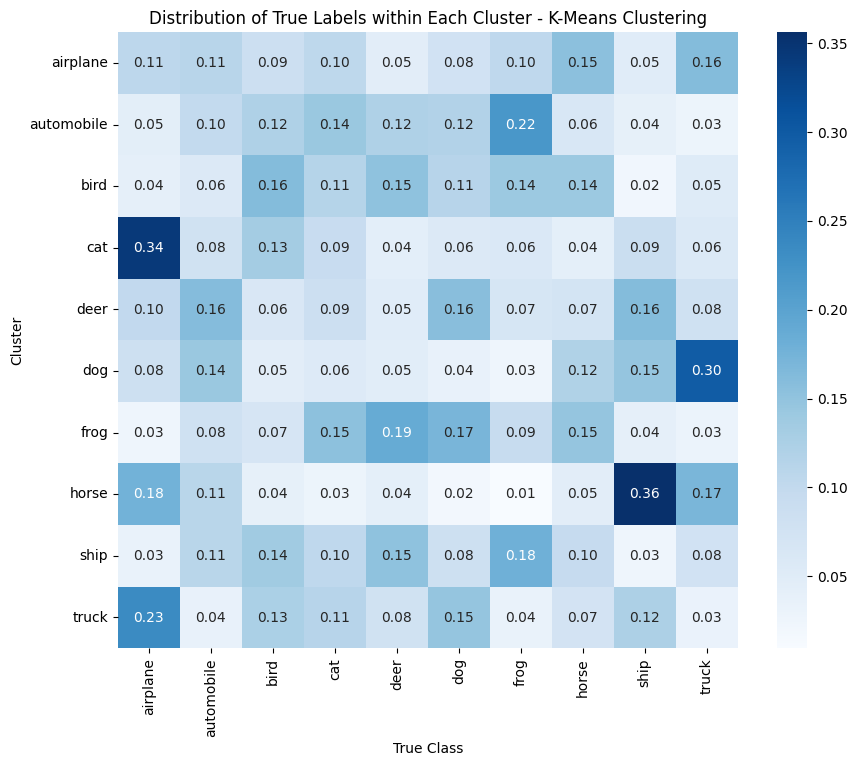

In [18]:
# Create a confusion matrix-like visualization for cluster vs. true label
cluster_label_counts = pd.crosstab(kmeans_labels, y_train_full)

# Normalize by row
cluster_label_probs = cluster_label_counts.div(cluster_label_counts.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_label_probs, annot=True, cmap='Blues', fmt='.2f',xticklabels=class_names, yticklabels=class_names)
plt.title('Distribution of True Labels within Each Cluster - K-Means Clustering')
plt.xlabel('True Class')
plt.ylabel('Cluster')
plt.show()

### Hierarchical/Agglomerative Clustering

- This approach provides valuable insights into the multi-level structure of CIFAR-10 data by creating a nested hierarchy of clusters.
- Unlike K-Means, it doesn't require specifying the number of clusters beforehand, allowing you to explore different clustering granularities through dendrogram visualization.
- This flexibility is particularly beneficial for understanding relationships between image categories in CIFAR-10, potentially revealing how classes like "automobile" and "truck" might be more closely related than "automobile" and "bird."
- The resulting hierarchy can uncover both coarse-grained (e.g., vehicles vs. animals) and fine-grained distinctions in the dataset.

#### Model Build

##### Silhouette scores for different linkage methods

In [19]:
silhouette_scores=[]

linkage_methods = ['ward', 'complete', 'average']
n_clusters = 10  # Using 10 clusters to match CIFAR-10 classes

for linkage in linkage_methods:
    print(f"Running Agglomerative Clustering with {linkage} linkage...")
    agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    agg_labels = agg_cluster.fit_predict(X_train_pca)
    silhouette_scores.append(silhouette_score(X_train_pca, agg_labels, random_state=42))

Running Agglomerative Clustering with ward linkage...
Running Agglomerative Clustering with complete linkage...
Running Agglomerative Clustering with average linkage...


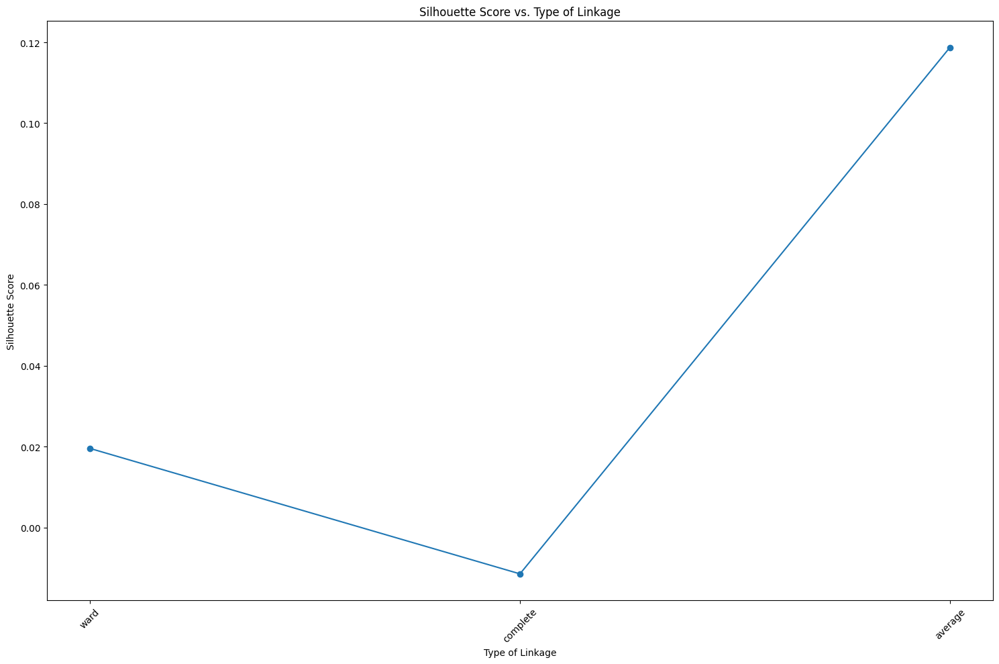

In [20]:
plt.figure(figsize=(15, 10))
plt.plot(range(len(silhouette_scores)), silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Type of Linkage')
plt.xlabel('Type of Linkage')
plt.ylabel('Silhouette Score')
plt.xticks(range(len(silhouette_scores)), linkage_methods, rotation=45)
plt.tight_layout()
plt.show()

##### Model Build with best linkage

In [26]:
# finding best linkage
best_linkage = 'ward'
print(f"Agglomerative Clustering best linkage: {best_linkage}")
# running with best linkage
agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, linkage=best_linkage)
agg_labels = agg_cluster.fit_predict(X_train_pca)
agg_silhouette = silhouette_score(X_train_pca, agg_labels,random_state=42)
print(f"\nAgglomerative Clustering silhouette score: {agg_silhouette:.4f}")

Agglomerative Clustering best linkage: ward

Agglomerative Clustering silhouette score: 0.0195


#### Visualize Clusters on PCA-reduced data

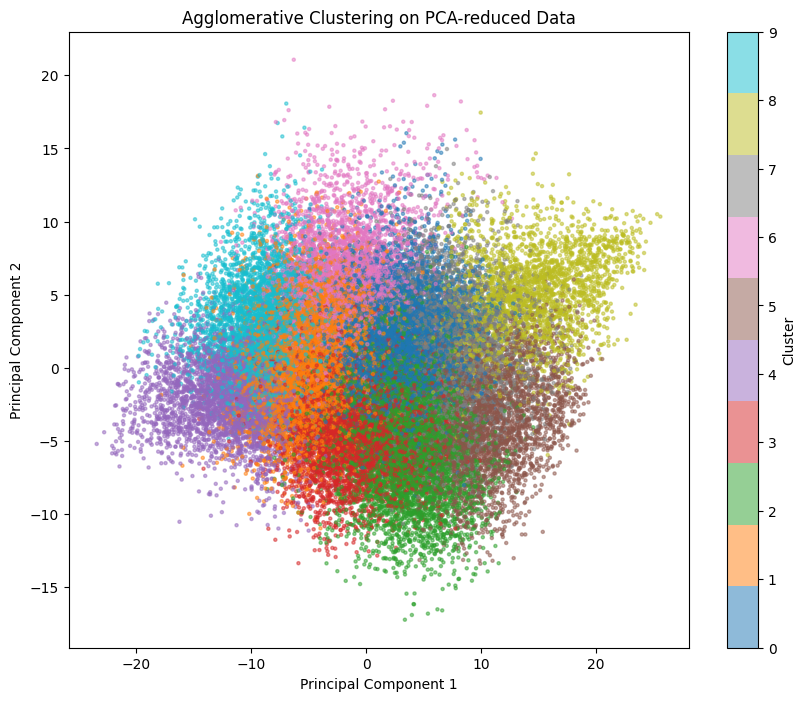

In [27]:
# Visualize the first few principal components
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_train_scaled)

# Visualize clusters on PCA-reduced data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=agg_labels, 
                     cmap='tab10', alpha=0.5, s=5)
plt.colorbar(scatter, label='Cluster')
plt.title('Agglomerative Clustering on PCA-reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

#### t-SNE Projection of Clusters

Computing t-SNE projection...


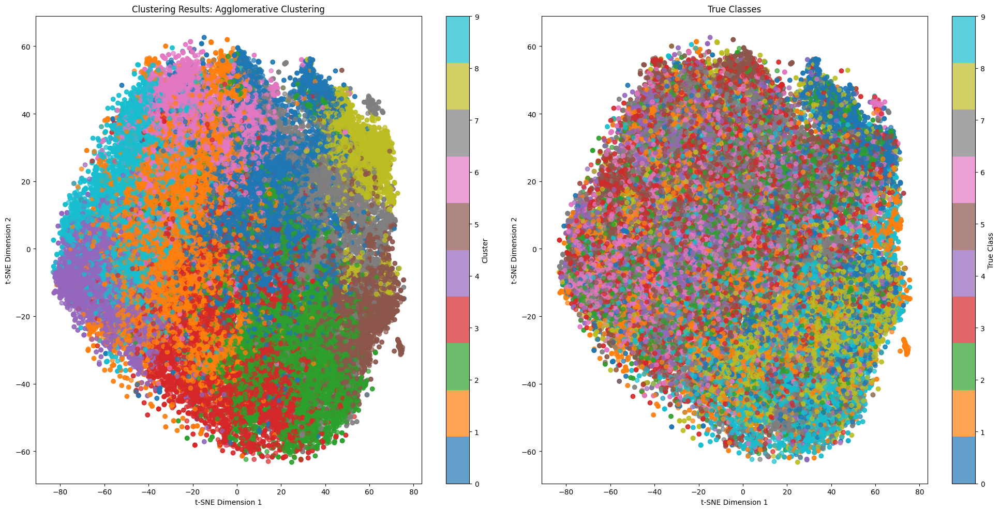

In [28]:
# Use t-SNE for visualization (reduce to 2D)
print("Computing t-SNE projection...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_train_pca)

plt.figure(figsize=(20, 10))

# Plot clustering results
plt.subplot(1, 2, 1)
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=agg_labels, cmap='tab10', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'Clustering Results: Agglomerative Clustering')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# If true labels are provided, plot them for comparison
if y_test is not None:
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_train_full, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter, label='True Class')
    plt.title('True Classes')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

plt.tight_layout()
plt.show()

#### Confusion Matrix

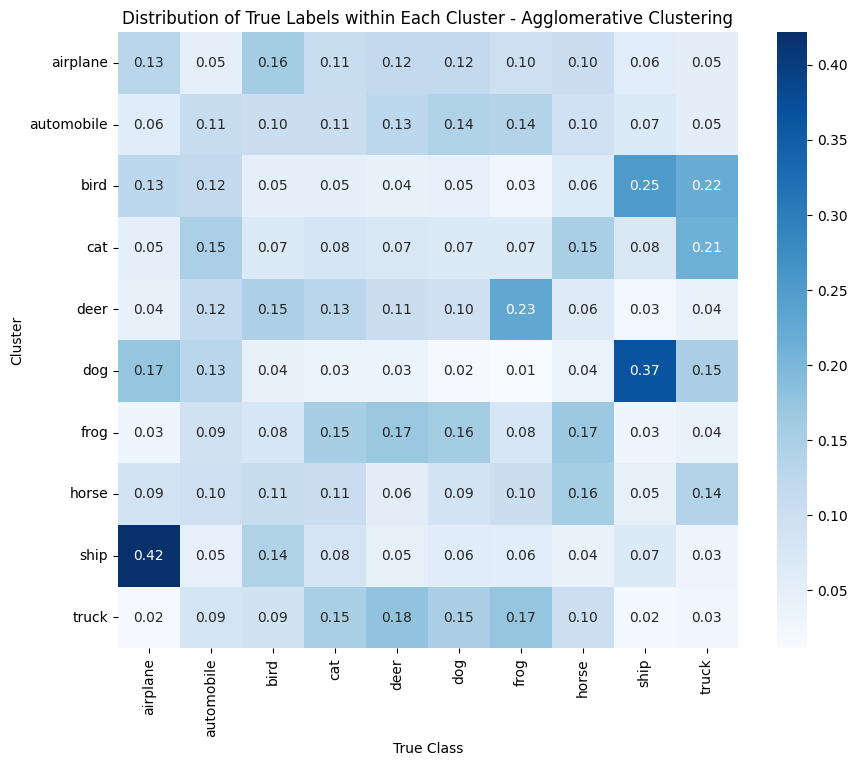

In [29]:
# Create a confusion matrix-like visualization for cluster vs. true label
cluster_label_counts = pd.crosstab(agg_labels, y_train_full)

# Normalize by row
cluster_label_probs = cluster_label_counts.div(cluster_label_counts.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_label_probs, annot=True, cmap='Blues', fmt='.2f',xticklabels=class_names, yticklabels=class_names)
plt.title('Distribution of True Labels within Each Cluster - Agglomerative Clustering')
plt.xlabel('True Class')
plt.ylabel('Cluster')
plt.show()

### Non-Negative Matrix Factorization (NMF)

- NMF is particularly suited for CIFAR-10 because it can decompose the image data into interpretable components that often align with meaningful visual features.
- By factorizing the image data into two non-negative matrices, NMF identifies parts-based representations that correspond to distinctive visual elements present across the dataset.
- For CIFAR-10's natural images, these components might represent features like textures, shapes, or color patterns that make up objects like cars, planes, or animals.
- The additive nature of NMF aligns well with how natural images are composed, making the results more interpretable than many other dimensionality reduction techniques.

#### Model Build

In [30]:
n_components = 10  # Using 10 components to match CIFAR-10 classes
nmf = NMF(n_components=n_components, random_state=42, max_iter=300)
W = nmf.fit_transform(X_train_scaled)

# Use KMeans on the NMF feature space to create clusters
kmeans_nmf = KMeans(n_clusters=10, random_state=42, n_init=10)
nmf_labels = kmeans_nmf.fit_predict(W)

nmf_silhouette = silhouette_score(X_train_pca, nmf_labels, random_state=42)
print(f"NMF + K-Means Clustering silhouette score: {nmf_silhouette:.4f}")

NMF + K-Means Clustering silhouette score: 0.0077


#### Visualize Clusters on PCA-reduced data

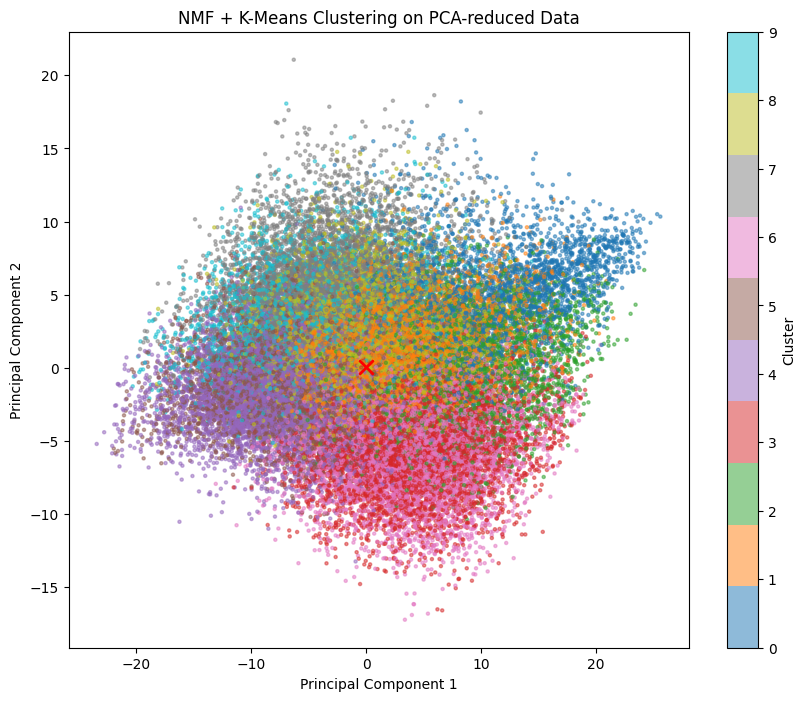

In [31]:
# Visualize the first few principal components
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_train_scaled)

# Visualize clusters on PCA-reduced data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=nmf_labels, 
                     cmap='tab10', alpha=0.5, s=5)
plt.scatter(kmeans_nmf.cluster_centers_[:, 0], kmeans_nmf.cluster_centers_[:, 1], 
            c='red', s=100, alpha=0.5, marker='x')
plt.colorbar(scatter, label='Cluster')
plt.title('NMF + K-Means Clustering on PCA-reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

#### t-SNE Projection of Clusters

Computing t-SNE projection...


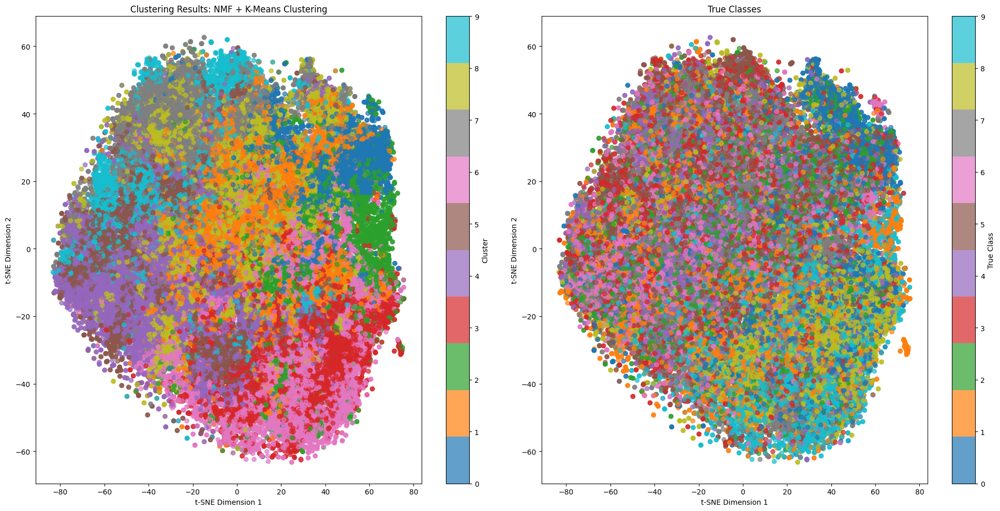

In [32]:
# Use t-SNE for visualization (reduce to 2D)
print("Computing t-SNE projection...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_train_pca)

plt.figure(figsize=(20, 10))

# Plot clustering results
plt.subplot(1, 2, 1)
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=nmf_labels, cmap='tab10', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'Clustering Results: NMF + K-Means Clustering')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# If true labels are provided, plot them for comparison
if y_test is not None:
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_train_full, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter, label='True Class')
    plt.title('True Classes')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

plt.tight_layout()
plt.show()

#### Confusion Matrix

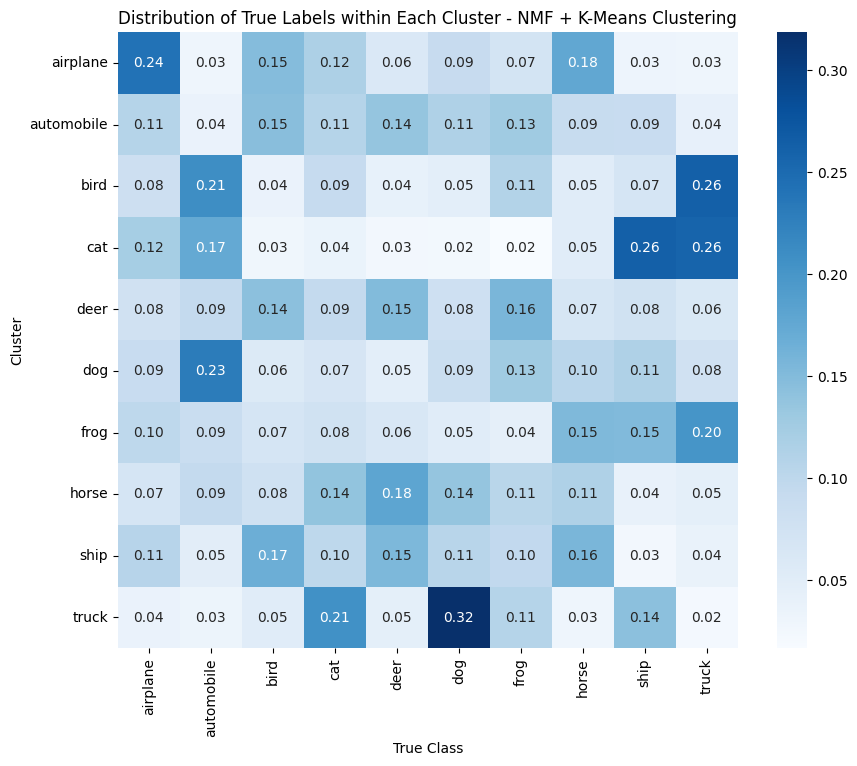

In [33]:
# Create a confusion matrix-like visualization for cluster vs. true label
cluster_label_counts = pd.crosstab(nmf_labels, y_train_full)

# Normalize by row
cluster_label_probs = cluster_label_counts.div(cluster_label_counts.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_label_probs, annot=True, cmap='Blues', fmt='.2f',xticklabels=class_names, yticklabels=class_names)
plt.title('Distribution of True Labels within Each Cluster - NMF + K-Means Clustering')
plt.xlabel('True Class')
plt.ylabel('Cluster')
plt.show()

## Model Comparison

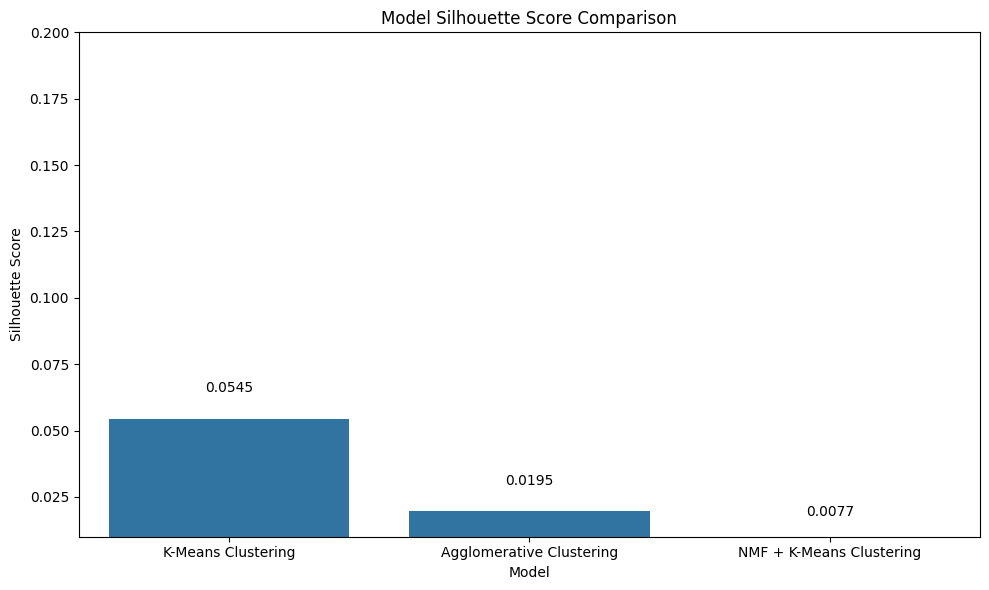

Best model: K-Means Clustering with silhouette score: 0.0545


In [34]:
# Compare all models on silhouette score
models = {
    'K-Means Clustering': (kmeans, kmeans_labels, kmeans_silhouette),
    'Agglomerative Clustering': (agg_cluster, agg_labels, agg_silhouette),
    'NMF + K-Means Clustering': (kmeans_nmf, nmf_labels, nmf_silhouette)
}

# Plot comparison
plt.figure(figsize=(10, 6))
accuracies = [acc for _,_,acc in models.values()]
model_names = list(models.keys())

sns.barplot(x=model_names, y=accuracies)
plt.title('Model Silhouette Score Comparison')
plt.xlabel('Model')
plt.ylabel('Silhouette Score')
plt.ylim(0.01, 0.2)  # Assuming all models perform reasonably well
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.01, f'{acc:.4f}', ha='center')
plt.tight_layout()
plt.show()

# Select the best model based on silhouette score
best_model_name = max(models, key=lambda k: models[k][2])
best_model, best_model_labels, best_accuracy = models[best_model_name]

print(f"Best model: {best_model_name} with silhouette score: {best_accuracy:.4f}")

## Training Set Misclassified Samples 

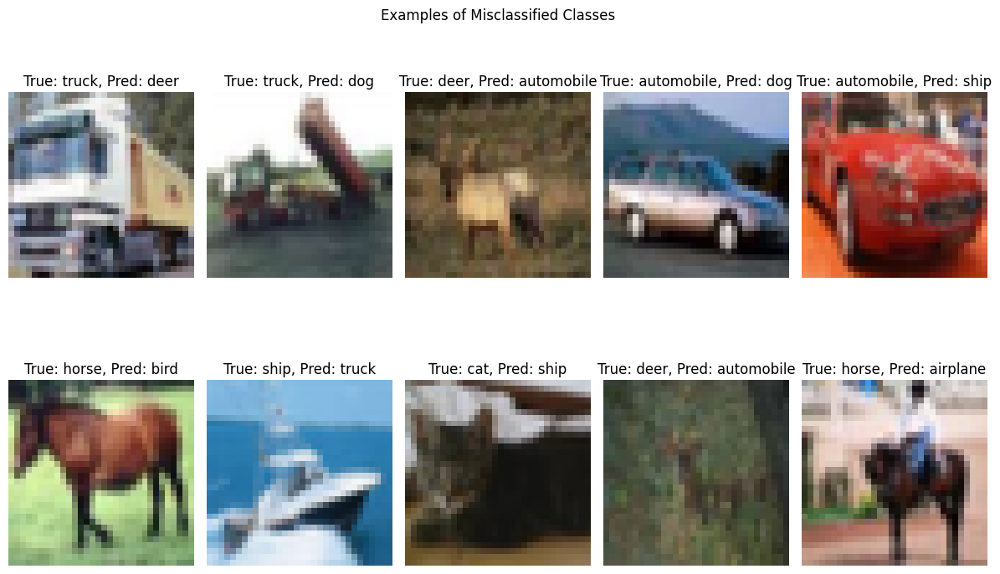

In [35]:
incorrect = X_train_full[y_train_full != best_model_labels]
incorrect_labels = y_train_full[y_train_full != best_model_labels]
incorrect_preds = best_model_labels[y_train_full != best_model_labels]

plt.figure(figsize=(12, 8))
for i in range(min(10, len(incorrect))):
    plt.subplot(2, 5, i+1)
    plt.imshow(incorrect[i], cmap='gray')
    plt.title(f"True: {class_names[incorrect_labels[i]]}, Pred: {class_names[incorrect_preds[i]]}")
    plt.axis('off')
plt.tight_layout()
plt.suptitle("Examples of Misclassified Classes")
plt.show()

## Best Model Evaluation on Test Set

In [36]:
y_pred_test = best_model.fit_predict(X_test_pca)
best_model_silhouette = silhouette_score(X_test_pca, y_pred_test, random_state=42)
print(f"K-Means Clustering silhouette score: {best_model_silhouette:.4f}")

K-Means Clustering silhouette score: 0.0532


###  Visualize Clusters on PCA-reduced data

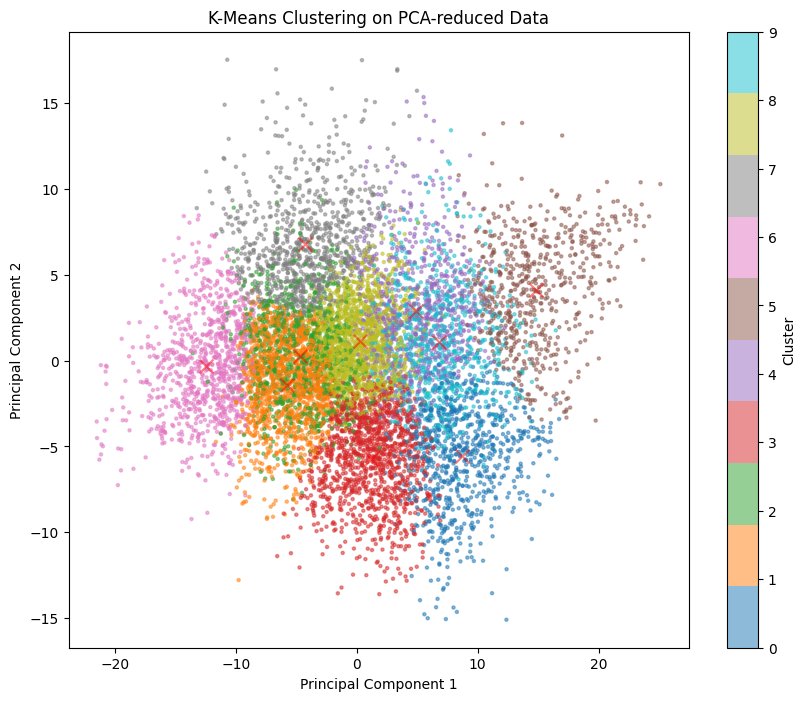

In [37]:
# Visualize the first few principal components
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_test_scaled)

# Visualize clusters on PCA-reduced data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=y_pred_test, 
                     cmap='tab10', alpha=0.5, s=5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', s=100, alpha=0.5, marker='x')
plt.colorbar(scatter, label='Cluster')
plt.title('K-Means Clustering on PCA-reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

### t-SNE Projection of Clusters

Computing t-SNE projection...


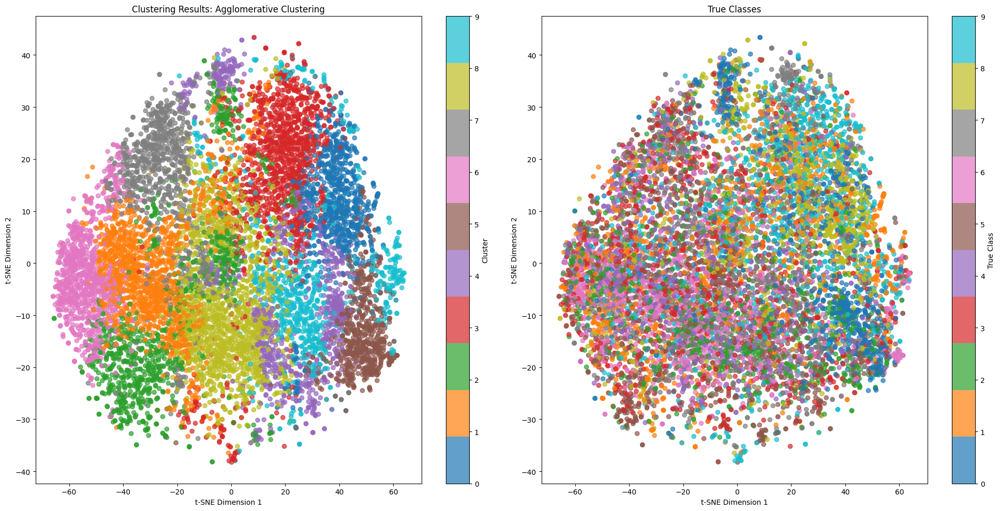

In [39]:
# Use t-SNE for visualization (reduce to 2D)
print("Computing t-SNE projection...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_test_pca)

plt.figure(figsize=(20, 10))

# Plot clustering results
plt.subplot(1, 2, 1)
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_pred_test, cmap='tab10', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'Clustering Results: Agglomerative Clustering')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# If true labels are provided, plot them for comparison
if y_test is not None:
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_test, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter, label='True Class')
    plt.title('True Classes')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

plt.tight_layout()
plt.show()

### Confusion Matrix

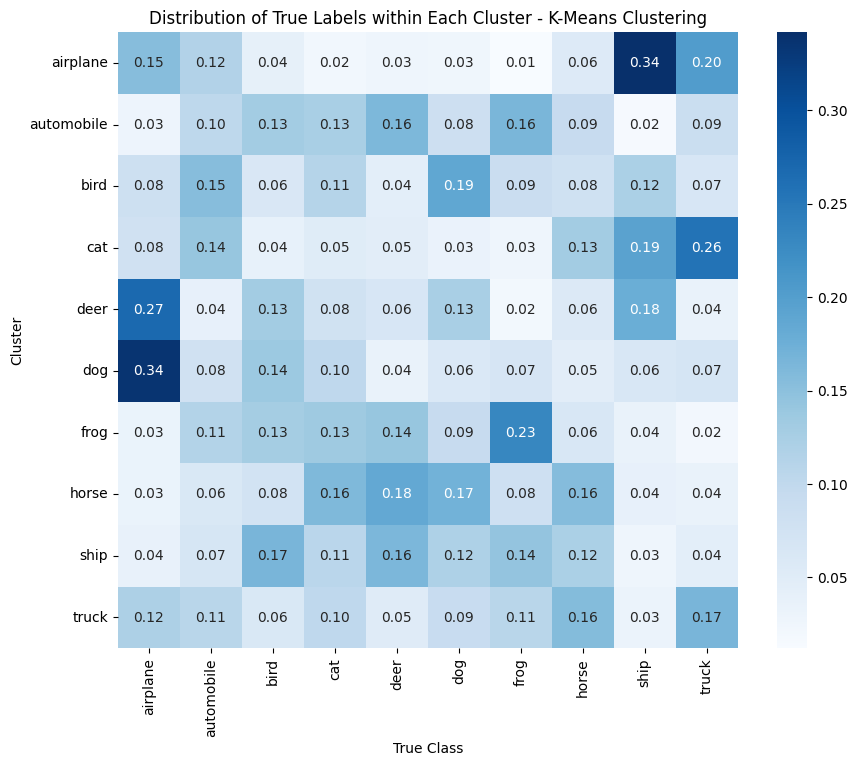

In [40]:
# Create a confusion matrix-like visualization for cluster vs. true label
cluster_label_counts = pd.crosstab(y_pred_test, y_test)

# Normalize by row
cluster_label_probs = cluster_label_counts.div(cluster_label_counts.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_label_probs, annot=True, cmap='Blues', fmt='.2f',xticklabels=class_names, yticklabels=class_names)
plt.title('Distribution of True Labels within Each Cluster - K-Means Clustering')
plt.xlabel('True Class')
plt.ylabel('Cluster')
plt.show()

### Test Set Misclassified Samples

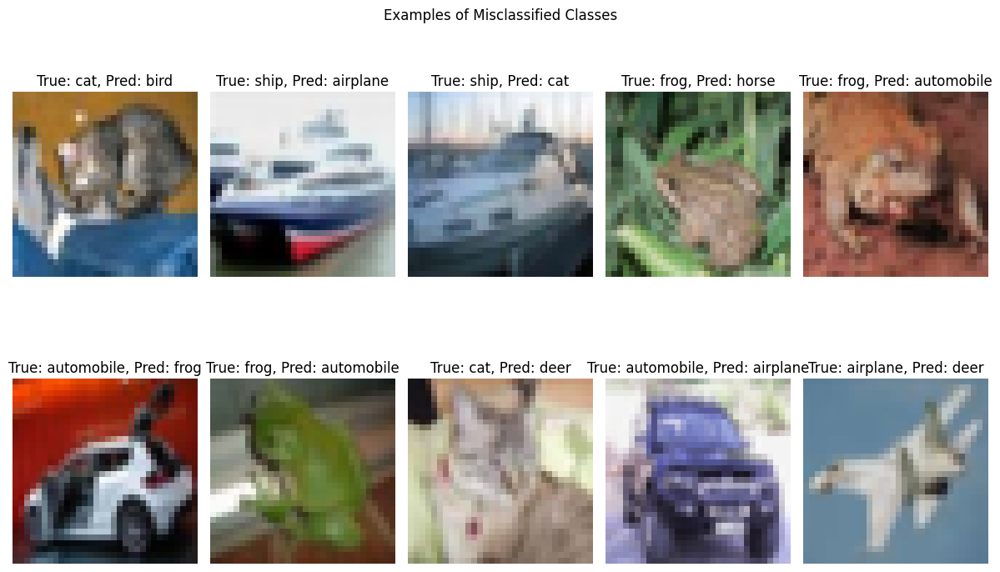

In [41]:
incorrect = X_test[y_test != y_pred_test]
incorrect_labels = y_test[y_test != y_pred_test]
incorrect_preds = y_pred_test[y_test != y_pred_test]

plt.figure(figsize=(12, 8))
for i in range(min(10, len(incorrect))):
    plt.subplot(2, 5, i+1)
    plt.imshow(incorrect[i], cmap='gray')
    plt.title(f"True: {class_names[incorrect_labels[i]]}, Pred: {class_names[incorrect_preds[i]]}")
    plt.axis('off')
plt.tight_layout()
plt.suptitle("Examples of Misclassified Classes")
plt.show()

## Summary of Results
Based on my experiments with three different supervised machine learning algorithms on the CIFAR10 dataset, below are the key observations:

1. **K-Means Clustering**:
   - K-Means clustered the images into 10 distinct groups, but the clusters don't perfectly align with the true CIFAR-10 classes.
   - The algorithm identified patterns based on color and shape similarities, which sometimes cut across the semantic categories humans use.
   - The visualization of cluster centers revealed interesting "average" representations of each cluster.
   - Some clusters were dominated by specific classes, showing that K-Means did capture some semantic meaning without being explicitly trained on it.

2. **Agglomerative Clustering**:
   - The hierarchical approach yielded different results based on the linkage method, with Ward linkage generally performing best.
   - Compared to K-Means, Agglomerative Clustering tended to create more imbalanced clusters.
   - The hierarchical structure provides additional insights into the relationships between clusters.
   - The computational cost was significantly higher than K-Means, especially with large datasets.

3. **Non-negative Matrix Factorization (NMF)**:
   - NMF discovered interesting basis components that can be interpreted as "parts" of images.
   - The components captured color patterns, shapes, and textures that appear across the dataset.
   - Using NMF features for clustering (NMF+KMeans) provided a different perspective on the data structure.
   - The reconstruction error gives us insight into how well the components capture the dataset variation.


### Potential Applications:

1. **Image organization and retrieval**: Clustering similar images for faster search and organization.
2. **Anomaly detection**: Identifying unusual images that don't fit well into any cluster.
3. **Feature extraction**: Using NMF components or cluster assignments as features for downstream supervised tasks.
4. **Data preprocessing**: Creating balanced subsets of data based on visual characteristics rather than labels.

### Future Work:

1. **Feature engineering**: Exploring different image features beyond raw pixels, such as HOG, SIFT, or pretrained CNN features.
2. **Ensemble methods**: Combining multiple clustering approaches for more robust results.
3. **Advanced dimension reduction**: Using t-SNE or UMAP for better preservation of local structure before clustering.
4. **Semi-supervised approaches**: Incorporating a small amount of labeled data to guide the unsupervised learning process.

## Conclusion

This analysis demonstrated the application of three unsupervised learning techniques to the CIFAR-10 dataset. While none of the methods perfectly recovered the human-defined classes, they all revealed interesting patterns and structures within the data without using class labels.

K-Means provided a simple and effective baseline with reasonable computational efficiency. Agglomerative Clustering offered insights into hierarchical relationships but at a higher computational cost. NMF revealed interpretable components that represent common patterns across the dataset.

Unsupervised learning on image data remains challenging due to the semantic gap between pixel-level features and human-defined categories. However, these methods provide valuable tools for exploring and understanding complex datasets when labels are unavailable or expensive to obtain.